In [1]:
using Plots
using CSV
using DataFrames
using LaTeXStrings
#using FileIO
#using JLD2

In [2]:
# Reference the in-tree version of CalibrateEmulateSample on Julias load path
prepend!(LOAD_PATH, [joinpath(@__DIR__, "..", "..", "CalibrateEmulateSample.jl")])
include(joinpath(@__DIR__, "..",  "..", "CalibrateEmulateSample.jl", "examples", "ci", "linkfig.jl"))

linkfig (generic function with 1 method)

In [3]:
# Import Calibrate-Emulate-Sample modules
using CalibrateEmulateSample.EnsembleKalmanProcessModule
using CalibrateEmulateSample.Emulators
using CalibrateEmulateSample.MarkovChainMonteCarlo
using CalibrateEmulateSample.Observations
using CalibrateEmulateSample.Utilities
using CalibrateEmulateSample.ParameterDistributionStorage
using CalibrateEmulateSample.DataStorage

In [4]:
using Random
using Statistics
using Distributions
using Measures

## Open all files
We need ground truth, parameter lists and QBO output (period/amplitude) files.

In [5]:
# Get observations ("truth" in the perfect model setting)
y_names = ["period", "amplitude"]

y_lims = [(10, 30), (20, 40)]

truthdir = "/home/users/lauraman/EKI_OBS/ground_truth_data"
truth_filename = "QBO_TT_metrics_ground_truth.csv"

filepath_truth = "$(truthdir)/$(truth_filename)"
df_truth = DataFrame(CSV.File(filepath_truth))
yt_ = zeros(length(y_names))
for (y_index, y_name) in enumerate(y_names)
    yt_[y_index] = df_truth[1, y_name]
end

# Also get variance for truth 
y_names_var = ["cov_00", "cov_01", "cov_10", "cov_11"]
yt_var_ = zeros(length(y_names), length(y_names))
yt_var_[1, 1] = df_truth[1, "cov_00"]
yt_var_[1, 2] = df_truth[1, "cov_01"]
yt_var_[2, 1] = df_truth[1, "cov_10"]
yt_var_[2, 2] = df_truth[1, "cov_11"]


truth = yt_
Γy = yt_var_

2×2 Matrix{Float64}:
 0.762856  0.246901
 0.246901  0.284432

In [6]:
truth

2-element Vector{Float64}:
 27.915249015787193
 22.897857142857138

In [7]:
## Get parameters and outputs
N_ens = 10 # number of ensemble members
N_iter = 8 # number of EKI iterations done so far (must be completed!)

8

In [8]:
# Get the input parameters 
println("Get inputs")
u_names = ["cwtropics", "Bt_eq"]
n_params = length(u_names)

# Get ensemble parameter inputs from txt file
u = zeros(N_iter, N_ens, n_params);
basedir = "/scratch/groups/aditis2/EKI_N$(N_ens)/"

for iter in 0:(N_iter-1) 
    paramlist = ("$(basedir)/iteration_$(iter)/paramlist.csv")
    df_params = DataFrame(CSV.File(paramlist))
    u[iter+1, 1:N_ens, 1] = df_params[!, u_names[1]]
    u[iter+1, 1:N_ens, 2] = df_params[!, u_names[2]]
end

u

Get inputs


8×10×2 Array{Float64, 3}:
[:, :, 1] =
 26.9538  47.887   73.8754   9.48608  …  54.8896  60.2691  36.8542  34.1249
 34.4544  77.7752  60.188   17.8875      58.2128  60.4219  42.4377  63.5397
 42.3298  72.5937  52.8913  43.9377      56.4105  61.6715  58.4104  57.1418
 43.5329  65.2913  55.5188  58.1349      63.1279  62.1559  57.7107  56.3893
 48.2115  64.7346  55.1591  54.6996      53.7425  58.9431  53.5827  52.2238
 47.3049  60.2687  51.6975  52.7336   …  53.0324  59.7035  52.0553  50.9172
 46.4112  54.7393  46.8537  52.4542      50.0935  53.3431  45.7581  48.1734
 46.3833  50.4508  43.8664  48.4702      50.5498  53.188   45.7174  48.7306

[:, :, 2] =
 0.0039826   0.00122947  0.00299088  …  0.00501824  0.00592634  0.00184806
 0.00352063  0.0024288   0.00317205     0.00415411  0.00444454  0.00291913
 0.00302984  0.00283854  0.00382014     0.00425506  0.00319935  0.0034582
 0.00294053  0.00362675  0.0034303      0.00392176  0.00322349  0.00336991
 0.00313671  0.00381374  0.00344955     0.

In [9]:
# Get outputs from file
println("Get outputs")
g_names = y_names
n_outputs = length(g_names)
g_ens = zeros(N_iter, N_ens, n_outputs)
filename = "QBO_TT_metrics.csv"

for iter in 0:(N_iter-1) 
    for ens_index in 0:(N_ens-1)
        filepath_out = "$(basedir)/iteration_$(iter)/$(ens_index)/$(filename)"
        df_out = DataFrame(CSV.File(filepath_out))
        colnames = names(df_out)
        for (g_index, g_name) in enumerate(g_names)
            g_ens[iter+1, ens_index+1, g_index] = df_out[1, g_name]
        end 
    end
end

g_ens


Get outputs


8×10×2 Array{Float64, 3}:
[:, :, 1] =
 24.5009  18.0517  33.3583  25.3893  …  23.3239  25.3156  21.5617  17.7629
 26.6172  29.4026  27.6226  20.0376     29.4552  29.0286  24.3885  30.3576
 28.247   31.9194  28.0119  23.783      21.5112  31.5322  29.4437  31.5252
 24.4583  29.2481  29.0003  30.5988     34.4226  27.0346  32.4426  31.3665
 31.0229  34.7378  32.3441  31.1707     28.744   27.7677  29.835   28.7805
 27.8876  34.3579  31.941   28.7621  …  30.2385  32.2117  33.7763  31.3478
 30.9013  31.4311  28.7626  30.7347     29.9287  28.9835  28.6124  27.5336
 27.6296  29.5618  29.3591  29.9499     31.9425  28.2006  30.2851  33.8226

[:, :, 2] =
 25.6215   7.88538  23.8279  14.1575  …  36.6124  30.7582  33.9386   8.64684
 25.0395  21.4432   21.4963  26.3573     24.4936  26.85    26.3072  22.7024
 22.3814  20.8403   26.1691  34.5043     20.0093  29.126   24.5219  26.0915
 19.0381  22.4084   23.7535  25.8363     28.171   25.3692  24.7115  25.2359
 24.6617  29.0809   24.9309  26.2818     23.

In [10]:
# Get training points
# Reshape u and g so that n_params and n_outputs come in first dimension
u_tp = permutedims(u, (3, 2, 1))
g_tp = permutedims(g_ens, (3, 2, 1))

## Condense the iterations and ensembles to create one large training dataset
u_tp = reshape(u_tp, (n_params, N_ens * N_iter) )
g_tp = reshape(g_tp, (n_outputs, N_ens * N_iter))

input_output_pairs = PairedDataContainer(u_tp, g_tp, data_are_columns=true)
@assert get_inputs(input_output_pairs) == u_tp
@assert get_outputs(input_output_pairs) == g_tp

In [11]:
plotdir="$(basedir)/PLOTS/"

"/scratch/groups/aditis2/EKI_N10//PLOTS/"

In [12]:
## Save if you want
##@save joinpath(output_directory, "input_output_pairs.jld2") input_output_pairs


In [21]:
println(" **** EMULATE ****")
println("Starting Gaussian Process Regression")
gppackage = Emulators.SKLJL()     # SKLJL or GPML
pred_type = Emulators.YType()
gauss_proc = GaussianProcess(
    gppackage; 
    kernel=nothing, # use default squared exponential kernel
    prediction_type=pred_type, 
    noise_learn=false             # true or false
)


emulator = Emulator(
    gauss_proc,
    input_output_pairs,
    #obs_noise_cov=Γy,            # use PCA or not
    normalize_inputs=true
)

optimize_hyperparameters!(emulator)     # remove to keep default

 **** EMULATE ****
Starting Gaussian Process Regression
Using default squared exponential kernel, learning length scale and variance parameters
Using default squared exponential kernel:PyObject 1**2 * RBF(length_scale=[1, 1])
Tuple{String, String, Matrix{Float64}, Int64, Bool}[("k1__constant_value", "numeric", [1.0e-5 10000.0], 1, 0), ("k2__length_scale", "numeric", [1.0e-5 10000.0; 1.0e-5 10000.0], 2, 0)]
Completed training of: 1, 
PyObject 1**2 * RBF(length_scale=[1, 1])
2, 
PyObject 1**2 * RBF(length_scale=[1, 1])
SKlearn, already trained. continuing...


In [24]:
# Create test to cover entire parameter space
test_points_cwtropics = shuffle(collect(range(0, 80, length=100)))
test_points_Bt_eq = shuffle(collect(range(0.001, 0.008, length=100)))
test_points = hcat(test_points_cwtropics, test_points_Bt_eq)'

y_mean_test, y_var_test = Emulators.predict(
    emulator, test_points;
    transform_to_real=false           # true if using PCA
)

# Get variances from our cov matrix
y_var_1 = [y_var[1,1] for y_var in y_var_test]
y_var_2 = [y_var[2,2] for y_var in y_var_test]
y_var_ = hcat(y_var_1, y_var_2) 

100×2 Matrix{Float64}:
  0.0861458    0.17251
  0.459026     0.751427
  1.18646      2.76791
  0.215698     0.313255
  4.55727     13.5296
  0.814648     2.35425
 21.1234      60.6402
 70.601      178.0
 92.8178     213.035
  4.02594      9.79764
  0.468287     0.645193
  8.48072     37.6888
  0.629048     1.08718
  ⋮          
  0.156124     0.241293
  4.25212      9.74286
  0.469531     1.37164
  2.59651      8.52887
  0.922535     2.5296
  3.47597      9.8748
  1.10682      2.41854
  0.115081     0.160113
  0.0407854    0.0624646
  8.20437     28.7807
  1.34642      2.20145
  3.6655      10.8659

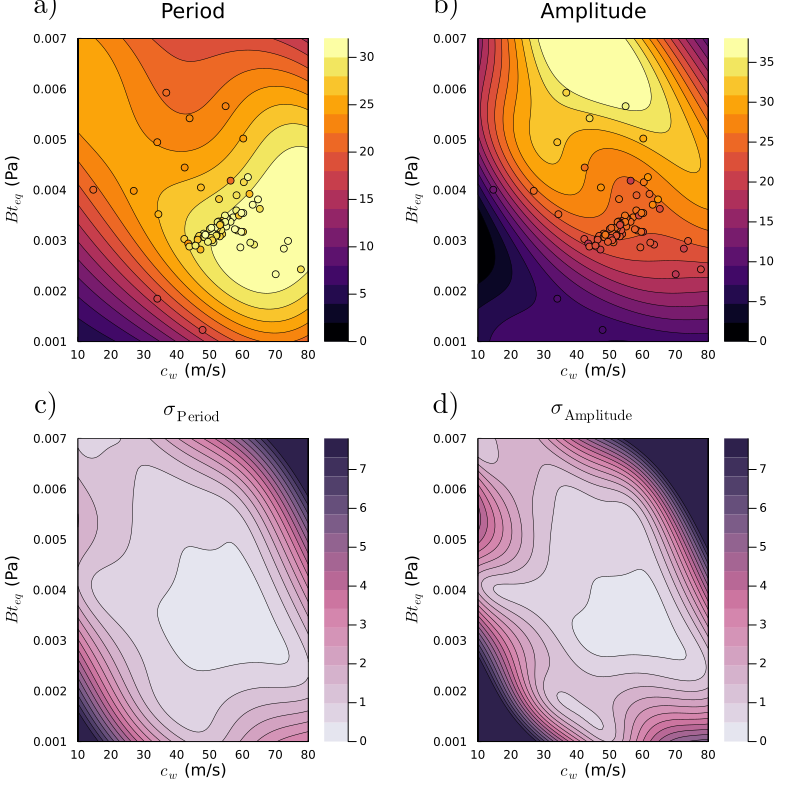

In [27]:
all_plots = Any[]
gr(size = (800, 800))
levels= [[0, 5], [0, 5] ]

x = (collect(range(10, 80, length=100)))
y = (collect(range(0.001, 0.007, length=100)))
clims_ = [(0, 32), (0, 38)]
clims_sd = [(0, 7.8), (0, 7.8)]
labels = ["a)", "b)"]
u_names = ["cwtropics", "Bt_eq"]
u_display_names = [L"$c_{w}$", L"$Bt_{eq}$"]
u_units = ["(m/s)", "(Pa)"]
u_lims = [(10, 80), (0.001, 0.007)]
n_params = length(u_names)

y_names = ["period", "amplitude"]
y_display_names = ["Period", "Amplitude"]
y_units = ["(months)", "(m/s)"]
y_lims = [(10, 30), (5, 35)]

for j in 1:n_outputs
    g_j = g_tp[j, :]
    Z = (g_j)
    # Need to find a better way to do this, can you pass kwargs to contour?
    function f(x,y)
        out, out_var = Emulators.predict(
        emulator, (hcat(x,y)');
        transform_to_real=false)
        return_val = out[j,:][1]
        if return_val < clims_[j][1]
            return_val =  clims_[j][1]
        end
        if return_val > clims_[j][2]
            return_val =  clims_[j][2]
        end 
        return_val
    end
    p1 = contour(x, y, f;
        fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
        title=y_display_names[j], clims=clims_[j],  linewidth=0.5 )
    
    annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))
    
    # Add data
    scatter!(u_tp[1,:], u_tp[2,:], color = :inferno, 
             zcolor=g_tp[j,:], clims=clims_[j], label=:false , xlims = u_lims[1],  
    ylims= u_lims[2], widen=:false, markerstrokewidth=0.5)

    push!(all_plots, p1)
end

labels = ["c)", "d)"]

# Plot uncertainties below
for j in 1:n_outputs
    g_j = g_tp[j, :]
    Z = (g_j)
    function f(x,y)
        out, out_var = Emulators.predict(
        emulator, (hcat(x,y)');
        transform_to_real=false)
        return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
        
        return_val
    end
    y_display_name = y_display_names[j]

    p1 = contour(x, y, f;
        fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
        title=L"$\sigma_{\mathrm{%$y_display_name}}$",  clims=clims_sd[j], linewidth=0.5, colorbar=:true,
        c=cgrad(:acton, rev=true) , linecolor=:black) #, extendhigh=:black)
    
    annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

    push!(all_plots, p1)
end



plot_all = plot(all_plots..., layout = (2,2), size=(800, 800))
#savefig(plot_all,"../output/GP_contour.png")
display(plot_all)



In [120]:
function f(x,y)
        out, out_var = Emulators.predict(
        emulator, (hcat(x,y)');
        transform_to_real=false)
        return_val = out[j,:][1]
        if return_val < clims_[j][1]
            return_val =  clims_[j][1]
        end
        if return_val > clims_[j][2]
            return_val =  clims_[j][2]
        end 
        return_val
    end

f (generic function with 1 method)

In [122]:
j=1
f(x,y)

4.178281841986944

## Plot Log likelihood (Mahalanobis distance)

In [34]:
out, out_var = Emulators.predict(
        emulator, (hcat(x,y)');
        transform_to_real=false)
out

2×100 Matrix{Float64}:
 4.17828  4.48681  4.82075  5.18137  …  17.4051  16.7194  16.0238  15.3218
 6.22919  6.37612  6.49009  6.56942     13.9584  12.7368  11.5739  10.4738

In [152]:
function mahalanobis_distance(y_pred, truth)
    dist = sum((transpose( y_pred - truth )  *  inv(Γy) * (y_pred - truth) / 2))
    dist
end

mahalanobis_distance (generic function with 1 method)

In [154]:
function f(x,y)
    out, out_var = Emulators.predict(
    emulator, (hcat(x,y)');
    transform_to_real=false)
    mahalanobis_distance(out, truth)
end

f (generic function with 1 method)

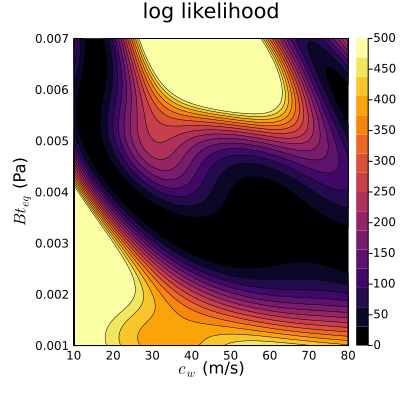

In [157]:
all_plots = Any[]
gr(size = (800, 800))
levels= [[0, 5], [0, 5] ]

x = (collect(range(10, 80, length=100)))
y = (collect(range(0.001, 0.007, length=100)))
clims_ = (0, 500)
u_names = ["cwtropics", "Bt_eq"]
u_display_names = [L"$c_{w}$", L"$Bt_{eq}$"]
u_units = ["(m/s)", "(Pa)"]
u_lims = [(10, 80), (0.001, 0.007)]
n_params = length(u_names)




p1 = contour(x, y, f;
    fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
    title="log likelihood",  clims=clims_, linewidth=0.5 )



push!(all_plots, p1)


plot_all = plot(all_plots..., layout = (1,1), size=(400, 400))
#savefig(plot_all,"../output/GP_contour.png")
display(plot_all)



In [ ]:
all_plots = Any[]
gr(size = (800, 800))
levels= [[0, 5], [0, 5] ]

x = (collect(range(10, 80, length=100)))
y = (collect(range(0.001, 0.007, length=100)))
clims_ = (0, 500)
u_names = ["cwtropics", "Bt_eq"]
u_display_names = [L"$c_{w}$", L"$Bt_{eq}$"]
u_units = ["(m/s)", "(Pa)"]
u_lims = [(10, 80), (0.001, 0.007)]
n_params = length(u_names)




p1 = contour(x, y, f;
    fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
    title="log likelihood",  clims=clims_, linewidth=0.5 )



push!(all_plots, p1)


plot_all = plot(all_plots..., layout = (1,1), size=(400, 400))
#savefig(plot_all,"../output/GP_contour.png")
display(plot_all)



## Sample
Next, we need to sample from the posterior distribution using MCMC. We use the emulator to sample from



In [28]:
using CalibrateEmulateSample.MarkovChainMonteCarlo
using CalibrateEmulateSample.Observations
using CalibrateEmulateSample.Utilities
using CalibrateEmulateSample.ParameterDistributionStorage
using CalibrateEmulateSample.DataStorage

In [29]:
## Prior
prior_Bt_eq = Distributions.Uniform(0.001, 0.007)
prior_cw_tropics = Distributions.Uniform(5, 80)
priors_parameterized = [Parameterized(prior_cw_tropics), Parameterized(prior_Bt_eq)]
constraints = [ [no_constraint()] , [no_constraint()] ]
param_names = ["cwtropics", "Bt_eq"]
priors = ParameterDistribution(priors_parameterized, constraints, param_names )

ParameterDistribution{Parameterized, EnsembleKalmanProcesses.ParameterDistributionStorage.ConstraintType, String}(Parameterized[Parameterized(Uniform{Float64}(a=5.0, b=80.0)), Parameterized(Uniform{Float64}(a=0.001, b=0.007))], EnsembleKalmanProcesses.ParameterDistributionStorage.ConstraintType[Constraint(EnsembleKalmanProcesses.ParameterDistributionStorage.var"#5#7"(), EnsembleKalmanProcesses.ParameterDistributionStorage.var"#6#8"()), Constraint(EnsembleKalmanProcesses.ParameterDistributionStorage.var"#5#7"(), EnsembleKalmanProcesses.ParameterDistributionStorage.var"#6#8"())], ["cwtropics", "Bt_eq"])

In [35]:
println(" **** SAMPLE **** ")
# initial values
u0 = vec(mean(get_inputs(input_output_pairs), dims=2))
#u0 = Vector([50, 1e-3])
println("initial parameters: ", u0)

# MCMC settingsa
mcmc_alg = "rwm" # random walk Metropolis

# First let's run a short chain to determine a good step size
burnin = 0
step = 0.1 # first guess
max_iter = 2000 # number of steps before checking acc/rej rate for step size determination
yt_sample = truth   # the data (here it is the truth in the perfect model setting)
mcmc_test = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, step, u0, max_iter, 
                         mcmc_alg, burnin, svdflag=true)
new_step = MarkovChainMonteCarlo.find_mcmc_step!(mcmc_test, emulator, max_iter=max_iter)

# Now begin the actual MCMC
println("Begin MCMC - with step size ", new_step)
burnin = 1000
max_iter = 100000
mcmc = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, new_step, u0, max_iter, mcmc_alg,
                    burnin, svdflag=false)
MarkovChainMonteCarlo.sample_posterior!(mcmc, emulator, max_iter)

posterior = MarkovChainMonteCarlo.get_posterior(mcmc)

post_mean = get_mean(posterior)
post_cov = get_cov(posterior)

println("prior mean")
println(get_mean(mcmc.prior))
println("prior covariance")
println(get_cov(mcmc.prior))

println("posterior mean")
println(post_mean)
println("posterior covariance")
println(post_cov)



 **** SAMPLE **** 
initial parameters: [51.66832030514788, 0.0034894445918698244]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
Begin step size search
iteration 0; current parameters [51.66832030514788 0.0034894445918698244]
iteration 2000; acceptance rate = 0.02348825587206397, current parameters [2.885788917274408; 0.005326852885573368;;]
new step size: 0.05
iteration 2000; acceptance rate = 0.3538230884557721, current parameters [79.35201748099377; 0.006780336880456331;;]
new step size: 0.1
iteration 2000; acceptance rate = 0.02448775612193903, current parameters [2.5947515439933997; 0.005538665015010086;;]
new step size: 0.07500000000000001
iteration 2000; acceptance rate = 0.03

In [36]:
posterior_samples_1 = dropdims(get_distribution(posterior)[param_names[1]],
                                         dims=1)
posterior_samples_2 = dropdims(get_distribution(posterior)[param_names[2]],
                                                                        dims=1) 
posterior_samples_all = hcat(posterior_samples_1, posterior_samples_2)
println(size(posterior_samples_all))


(99001, 2)


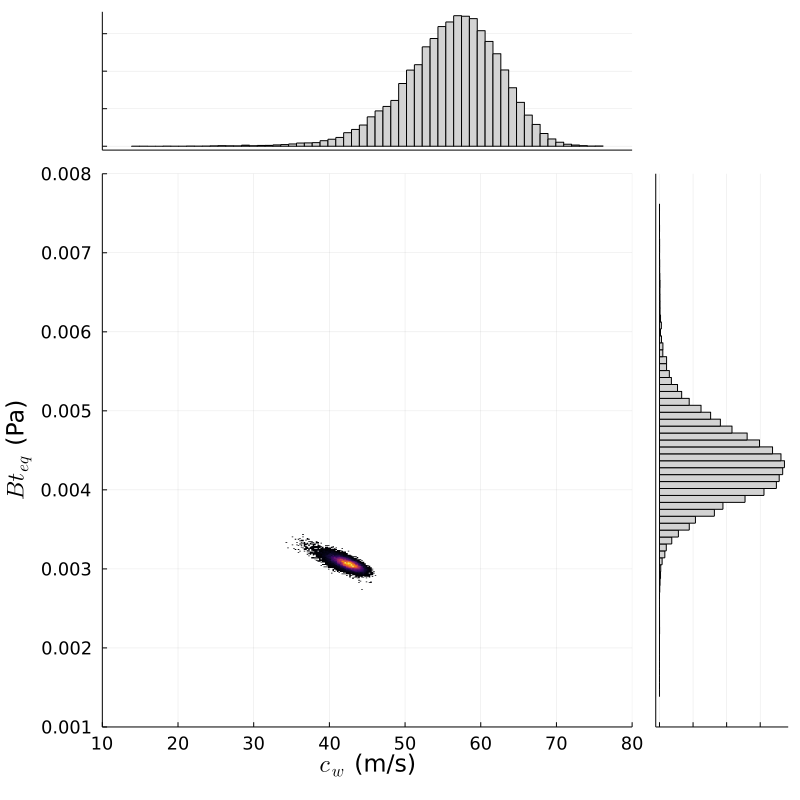

In [37]:
## 2D histogram
hist2d=histogram2d(posterior_samples_1[1000:90000], posterior_samples_2[1000:90000]; 
      label=:false, xlabel=u_display_names[1]*" "*u_units[1], ylabel=u_display_names[2]*" "*u_units[2],
    xlim=(10, 80), ylim=(0.001, 0.008),  xtickfontsize=12, ytickfontsize=12,
   # c = cgrad(:inferno, rev=true),
    xguidefontsize=16,  yguidefontsize=16, colorbar=:false) #, title="Gravity wave parameters")


## Plot cw histogram along top x-axis 
cw_samples =(posterior_samples_1[1000:90000])
tophist=histogram(cw_samples, bins=100, normed=true, fill=:lightgray, #ylim=(0.001, 0.006),
              thickness_scaling=2.0,  legend=:false, lab=:false, # lab="Posterior", 
    xtickfontsize=8, ytickfontsize=8, xrotation=45, xaxis=nothing)

plot!(tophist, yformatter=_->"")
plot!(tophist, xformatter=_->"")


#title!(tophist, u_display_names[2], orientation=:v)
plot(tophist, size=(800, 300))

## Plot Bteq along right-hand y-axis
Bt_eq_samples =(posterior_samples_2[1000:90000])
righthist=histogram(Bt_eq_samples, bins=100, normed=true, fill=:lightgray, #xlim=(10,80),
              thickness_scaling=2.0, orientation=:h,  legend=:false, lab=:false, #ylim=(0, 1),
    xtickfontsize=8, ytickfontsize=8 , yaxis=nothing)

plot!(righthist, yformatter=_->"")
plot!(righthist, xformatter=_->"")
plot(righthist, size=(300, 800))

plot(hist2d, size=(600,600))

layout = @layout [tophist{0.8w,0.2h} _
                  hist2d{0.8w,0.8h} righthist{0.2w,0.8h}]

## put together
plot_all = plot( tophist, hist2d, righthist, 
    layout=layout, 
    size=(800, 800), 
    legend = :true,  legendfont=font(6, "Computer Modern")) #,  
    #plot_title="Posterior Distribution", titlefont=font(18, "Computer Modern"))
##savefig(plot_all,"../output/samples.png")
display(plot_all)

## How do plots change at each iteration? 

In [60]:
function emulator_at_iter(u, g_ens, n_iter)
    # Get the input parameters 
    u_iter = u[1:n_iter,:,:]
    g_iter = g_ens[1:n_iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * n_iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * n_iter))

    input_output_pairs = PairedDataContainer(u_tp, g_tp, data_are_columns=true)
    @assert get_inputs(input_output_pairs) == u_tp
    @assert get_outputs(input_output_pairs) == g_tp
    println(" **** EMULATE ****")
    println("Starting Gaussian Process Regression")
    gppackage = Emulators.GPJL()
    pred_type = Emulators.YType()
    gauss_proc = GaussianProcess(
        gppackage; 
        kernel=nothing, # use default squared exponential kernel
        prediction_type=pred_type, 
        noise_learn=true
    )


    emulator = Emulator(
        gauss_proc,
        input_output_pairs,
        #obs_noise_cov=Γy,
        normalize_inputs=true
    )
    optimize_hyperparameters!(emulator)

      
    emulator
end

emulator_at_iter (generic function with 1 method)

In [61]:
size(u), size(g_ens)

((8, 10, 2), (8, 10, 2))

In [62]:
all_emulators = Any[]
for n_iter in 1:(N_iter)
    println("iteration $(n_iter)")
    emulator = emulator_at_iter(u, g_ens, n_iter)
    push!(all_emulators, emulator)
end

iteration 1
 **** EMULATE ****
Starting Gaussian Process Regression
Using default squared exponential kernel, learning length scale and variance parameters
Using default squared exponential kernel: Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]
Learning additive white noise
kernel in GaussianProcess:
Type: GaussianProcesses.SumKernel{GaussianProcesses.SEArd{Float64}, GaussianProcesses.Noise{Float64}}
  Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]  Type: GaussianProcesses.Noise{Float64}, Params: [0.0]
created GP: 1
kernel in GaussianProcess:
Type: GaussianProcesses.SumKernel{GaussianProcesses.SEArd{Float64}, GaussianProcesses.Noise{Float64}}
  Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]  Type: GaussianProcesses.Noise{Float64}, Params: [0.0]
created GP: 2
LinearAlgebra.PosDefException(3)
optimized hyperparameters of GP: 1
Type: GaussianProcesses.SumKernel{GaussianProcesses.SEArd{Float64}, GaussianProcesses.Noise{Float64}}
  Ty

LoadError: AssertionError: isfinite(phi_c) && isfinite(dphi_c)

In [63]:
# Create test to cover entire parameter space
test_points_cwtropics = shuffle(collect(range(0, 80, length=100)))
test_points_Bt_eq = shuffle(collect(range(0.001, 0.008, length=100)))
test_points = hcat(test_points_cwtropics, test_points_Bt_eq)'

2×100 adjoint(::Matrix{Float64}) with eltype Float64:
 71.9192      23.4343      0.0         …  17.7778      78.3838
  0.00255556   0.00757576  0.00333333      0.00778788   0.00623232

In [ ]:
for (iter, emulator) in enumerate(all_emulators)
    println(iter)
    
    # Get the input parameters 
    u_iter = u[1:iter,:,:]
    g_iter = g_ens[1:iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * iter))
    
    y_mean_test, y_var_test = Emulators.predict(
        emulator, test_points;
        transform_to_real=false
    )

    all_plots = Any[]
    
    labels = ["a)", "b)"]

    for j in 1:n_outputs
        g_j = g_tp[j, :]
        Z = (g_j)
        function f(x,y)
            out, out_var = Emulators.predict(
            emulator, (hcat(x,y)');
            transform_to_real=false)
            return_val = out[j,:][1]
            if return_val < clims_[j][1]
                return_val =  clims_[j][1]
            end
            if return_val > clims_[j][2]
                return_val =  clims_[j][2]
            end 
            return_val
        end
        p1 = contour(x, y, f;
            fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
            title=y_display_names[j], clims=clims_[j],  linewidth=0.5 )

        annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

        scatter!(u_tp[1,:], u_tp[2,:], color = :inferno, 
                 zcolor=g_tp[j,:], clims=clims_[j], label=:false , xlims = u_lims[1],  
        ylims= u_lims[2], widen=:false, markerstrokewidth=0.5)

        push!(all_plots, p1)
    end

    labels = ["c)", "d)"]

    # Plot uncertainties below
    for j in 1:n_outputs
        g_j = g_tp[j, :]
        Z = (g_j)
        function f(x,y)
            out, out_var = Emulators.predict(
            emulator, (hcat(x,y)');
            transform_to_real=false)
            return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
            """if return_val < clims_sd[j][1]
                return_val =  clims_sd[j][1]
            end
            if return_val > clims_sd[j][2]
                return_val =  clims_sd[j][2]
        end""" 
            return_val
        end
        y_display_name = y_display_names[j]

        p1 = contour(x, y, f;
            fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
            title=L"$\sigma_{\mathrm{%$y_display_name}}$",  clims=clims_sd[j], linewidth=0.5, colorbar=:true,
            c=cgrad(:acton, rev=true) , linecolor=:black) #, extendhigh=:black)

        ## Add contours beyond clims 
        """function f_unclipped(x,y)
            out, out_var = Emulators.predict(
            emulator, log.(hcat(x,y)');
            transform_to_real=true)
            return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]

            return_val
        end
        contour!(p1, x, y, f_unclipped; 
            fill=false, clims=(0, 20),  c=:black, colorbar=false, linewidth=0.5)"""

        annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

        push!(all_plots, p1)
    end



    plot_all = plot(all_plots..., layout = (2,2), size=(800, 800))
    savefig(plot_all, "$(plotdir)/GP_contour_with_points_iter_$(iter).png")
    display(plot_all)
    

end



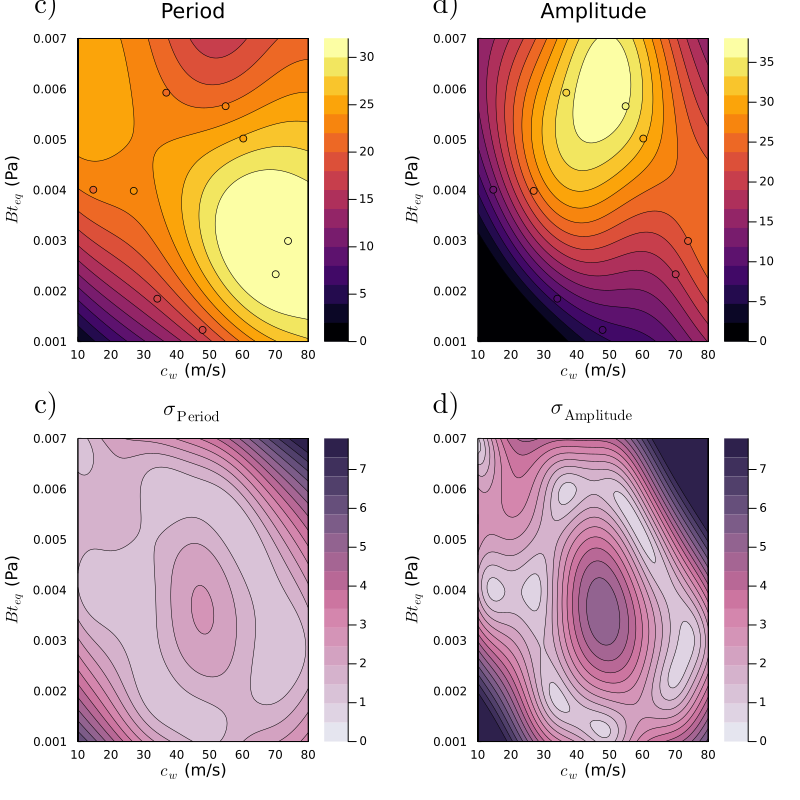

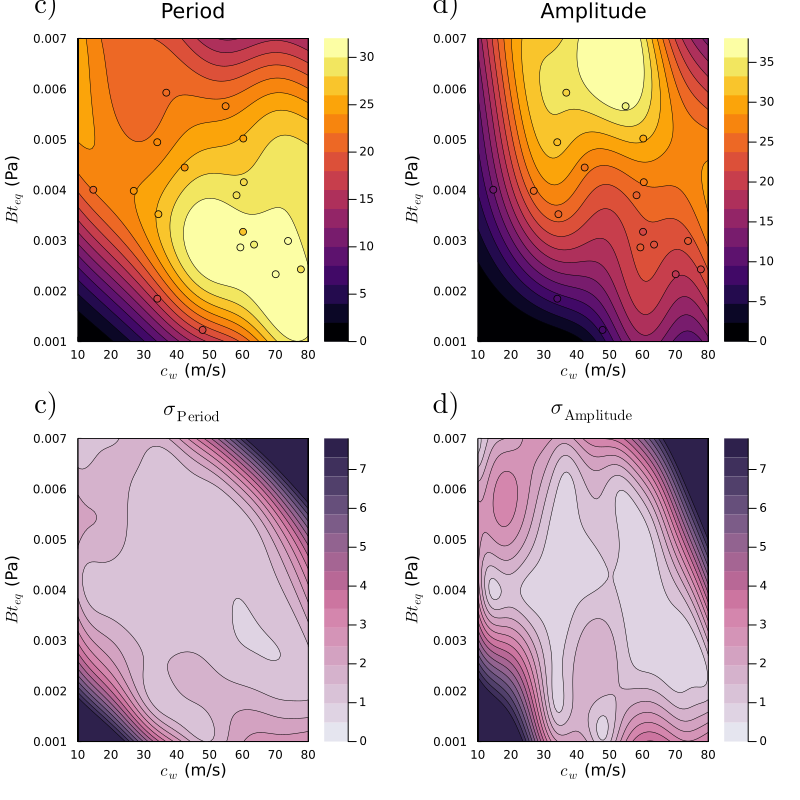

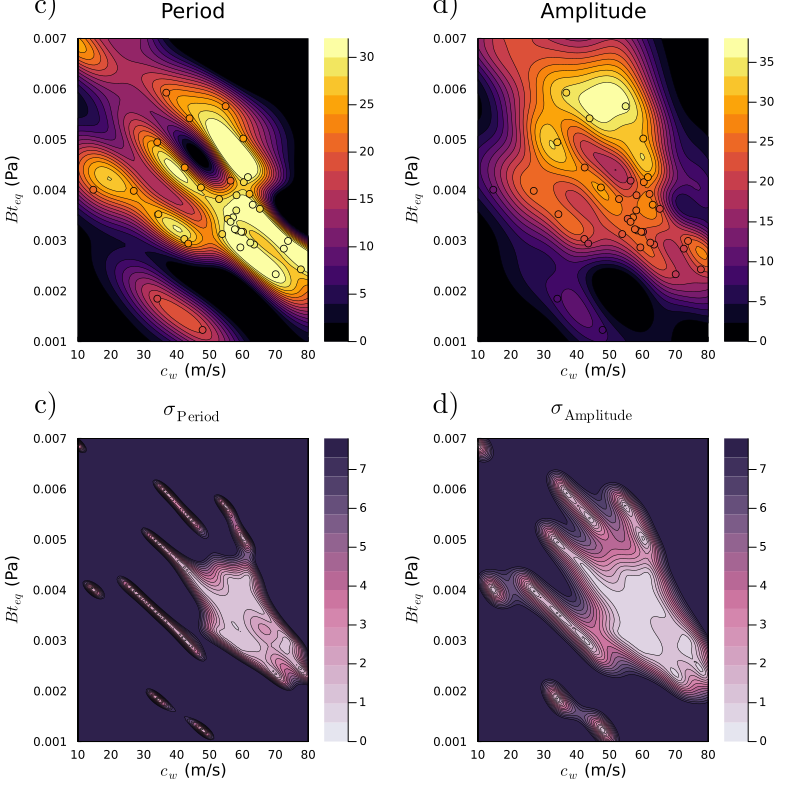

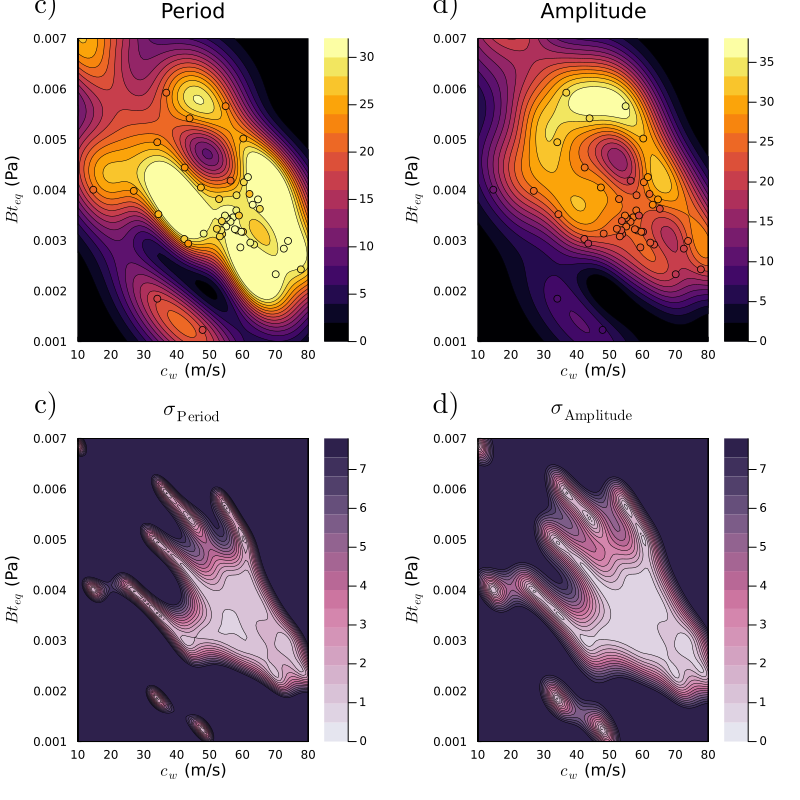

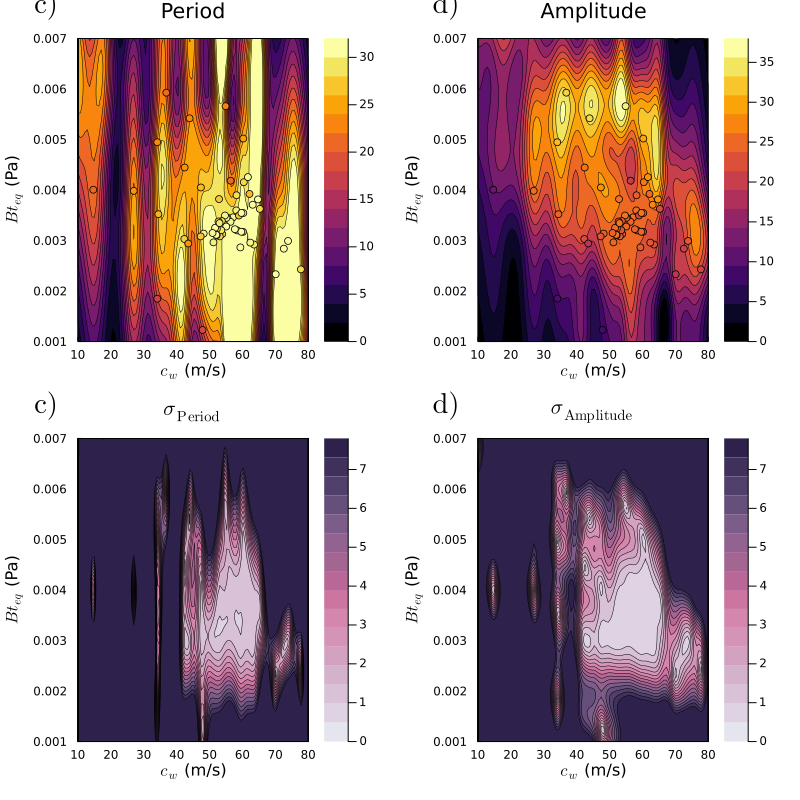

1
2
3
4
5
6


In [42]:
for (iter, emulator) in enumerate(all_emulators)
    println(iter)
    
    # Get the input parameters 
    u_iter = u[1:iter,:,:]
    g_iter = g_ens[1:iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * iter))
    
    y_mean_test, y_var_test = Emulators.predict(
        emulator, test_points;
        transform_to_real=true
    )

    all_plots = Any[]

    for j in 1:n_outputs
        g_j = g_tp[j, :]
        Z = (g_j)
        function f(x,y)
            out, out_var = Emulators.predict(
            emulator, (hcat(x,y)');
            transform_to_real=true)
            return_val = out[j,:][1]
            if return_val < clims_[j][1]
                return_val =  clims_[j][1]
            end
            if return_val > clims_[j][2]
                return_val =  clims_[j][2]
            end 
            return_val
        end
        p1 = contour(x, y, f;
            fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
            title=y_display_names[j], clims=clims_[j],  linewidth=0.5 )

        annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

        scatter!(u_tp[1,:], u_tp[2,:], color = :inferno, 
                 zcolor=g_tp[j,:], clims=clims_[j], label=:false , xlims = u_lims[1],  
        ylims= u_lims[2], widen=:false, markerstrokewidth=0.5)

        push!(all_plots, p1)
    end

    labels = ["c)", "d)"]

    # Plot uncertainties below
    for j in 1:n_outputs
        g_j = g_tp[j, :]
        Z = (g_j)
        function f(x,y)
            out, out_var = Emulators.predict(
            emulator, (hcat(x,y)');
            transform_to_real=true)
            return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
            """if return_val < clims_sd[j][1]
                return_val =  clims_sd[j][1]
            end
            if return_val > clims_sd[j][2]
                return_val =  clims_sd[j][2]
        end""" 
            return_val
        end
        y_display_name = y_display_names[j]

        p1 = contour(x, y, f;
            fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
            title=L"$\sigma_{\mathrm{%$y_display_name}}$",  clims=clims_sd[j], linewidth=0.5, colorbar=:true,
            c=cgrad(:acton, rev=true) , linecolor=:black) #, extendhigh=:black)

        ## Add contours beyond clims 
        """function f_unclipped(x,y)
            out, out_var = Emulators.predict(
            emulator, log.(hcat(x,y)');
            transform_to_real=true)
            return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]

            return_val
        end
        contour!(p1, x, y, f_unclipped; 
            fill=false, clims=(0, 20),  c=:black, colorbar=false, linewidth=0.5)"""

        annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

        push!(all_plots, p1)
    end



    plot_all = plot(all_plots..., layout = (2,2), size=(800, 800))
    savefig(plot_all, "$(plotdir)/GP_contour_with_points_iter_$(iter).png")
    display(plot_all)
    

end



1
 **** SAMPLE **** 
initial parameters: [42.91135155040035, 0.0039889373276449395]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
Begin step size search
iteration 0; current parameters [42.91135155040035 0.0039889373276449395]
iteration 2000; acceptance rate = 0.7306346826586707, current parameters [48.62148698082555; 0.0036317251550728098;;]
new step size: 0.2
iteration 2000; acceptance rate = 0.5667166416791605, current parameters [83.46091451413513; 0.005050351406472888;;]
new step size: 0.4
iteration 2000; acceptance rate = 0.26686656671664166, current parameters [40.78366196035365; 0.00236955337251454;;]


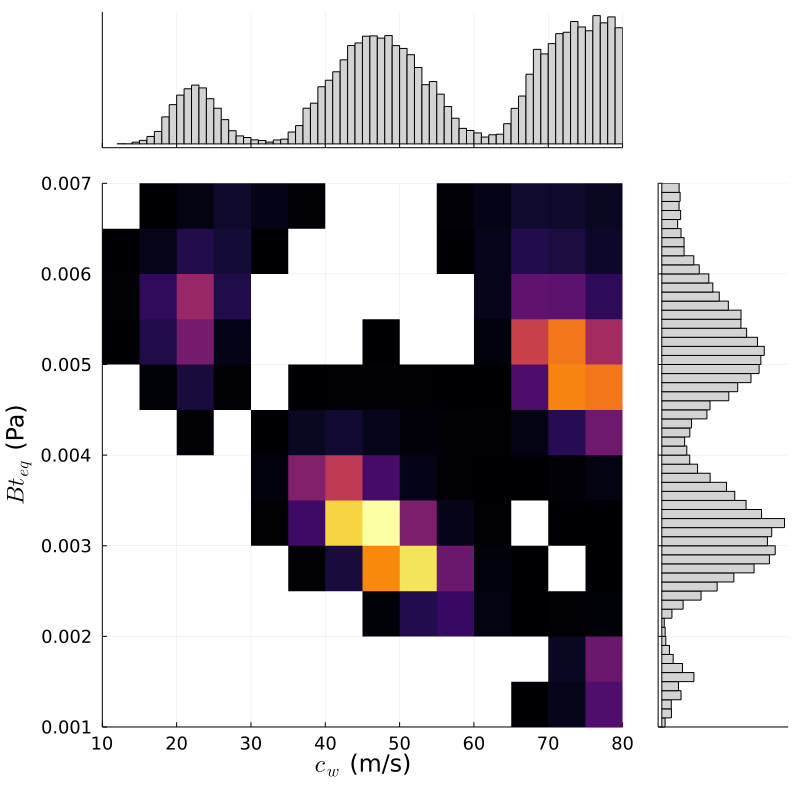

Begin MCMC - with step size 0.4
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[55.80884912410382; 0.0041345278474378385;;]
posterior covariance
[310.76816310294527 0.0; 0.0 1.7704871114892907e-6]
2
 **** SAMPLE **** 
initial parameters: [46.87601087438386, 0.003995940581685358]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357

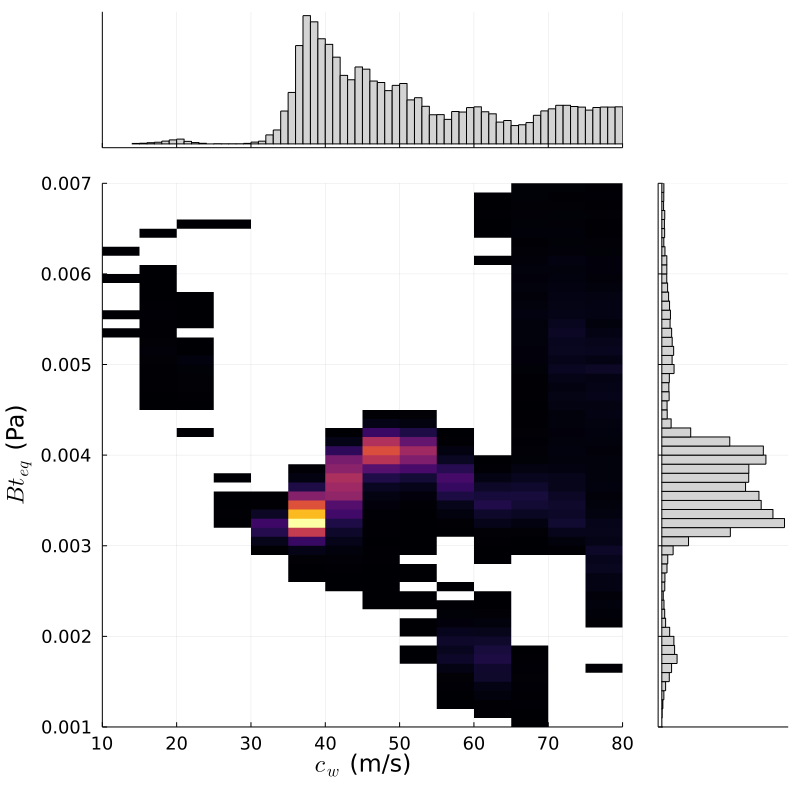

Begin MCMC - with step size 0.4
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[51.317261867255425; 0.003721988509588562;;]
posterior covariance
[188.23049866240126 0.0; 0.0 6.919023872357185e-7]
3
 **** SAMPLE **** 
initial parameters: [49.756042947558555, 0.003904386414949589]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357

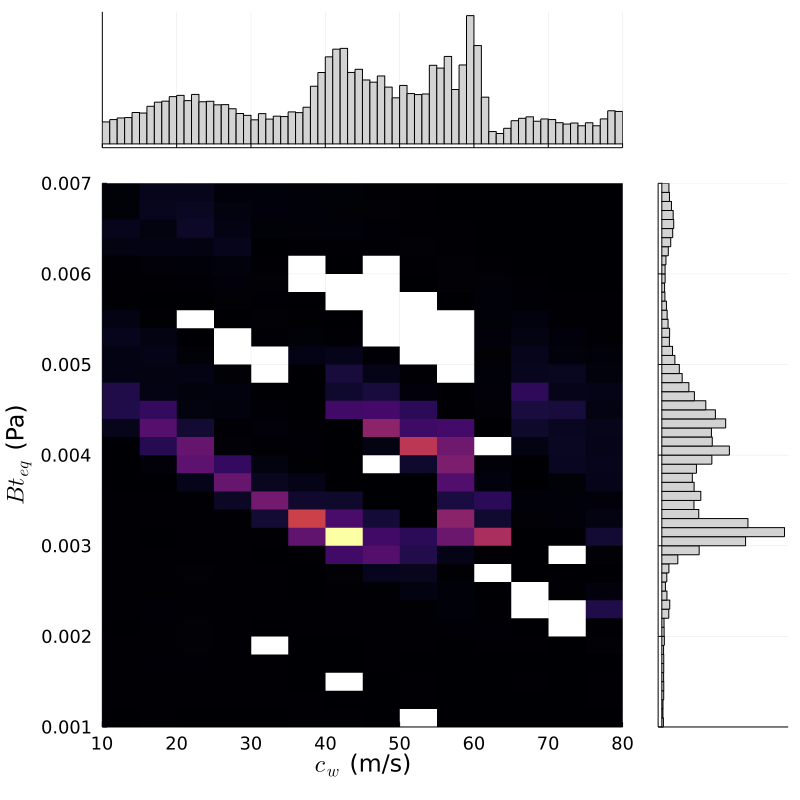

Begin MCMC - with step size 0.2
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[42.8974397665609; 0.003990448644196738;;]
posterior covariance
[328.9521192539707 0.0; 0.0 1.0778167120486133e-6]
4
 **** SAMPLE **** 
initial parameters: [51.70168034534341, 0.0037812089623661315]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.18744842935756

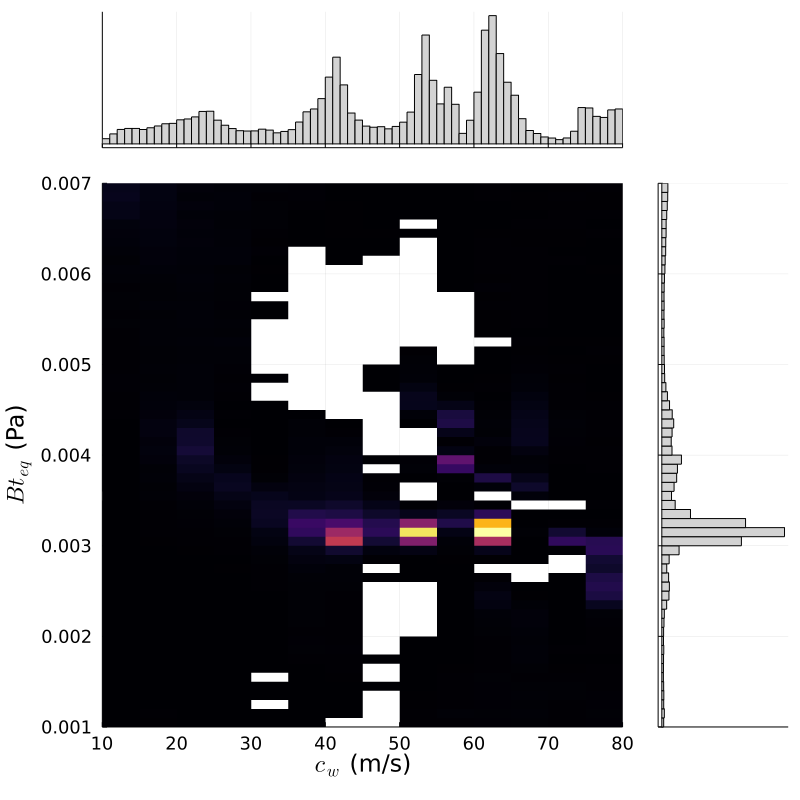

Begin MCMC - with step size 0.1
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[50.473459125212564; 0.0035938857225539388;;]
posterior covariance
[310.47194313632326 0.0; 0.0 1.2042219267872328e-6]
5
 **** SAMPLE **** 
initial parameters: [52.351305053542994, 0.0036963288603620932]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429

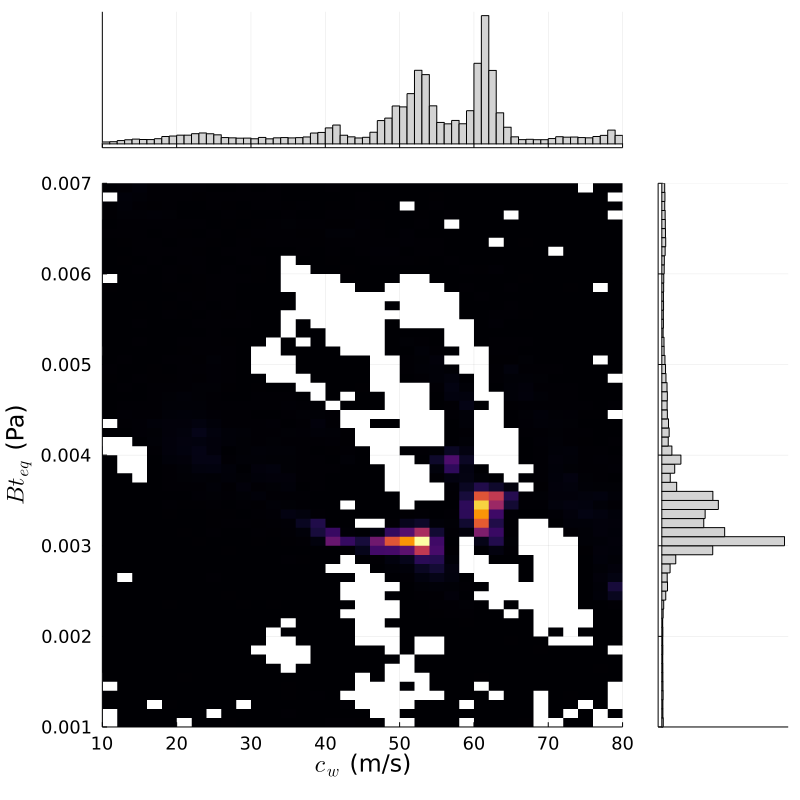

Begin MCMC - with step size 0.4
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[51.88550298494866; 0.0035345221090984885;;]
posterior covariance
[212.24475906855614 0.0; 0.0 8.476879025400042e-7]
6
 **** SAMPLE **** 
initial parameters: [52.47741803113495, 0.0036214644342701077]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357

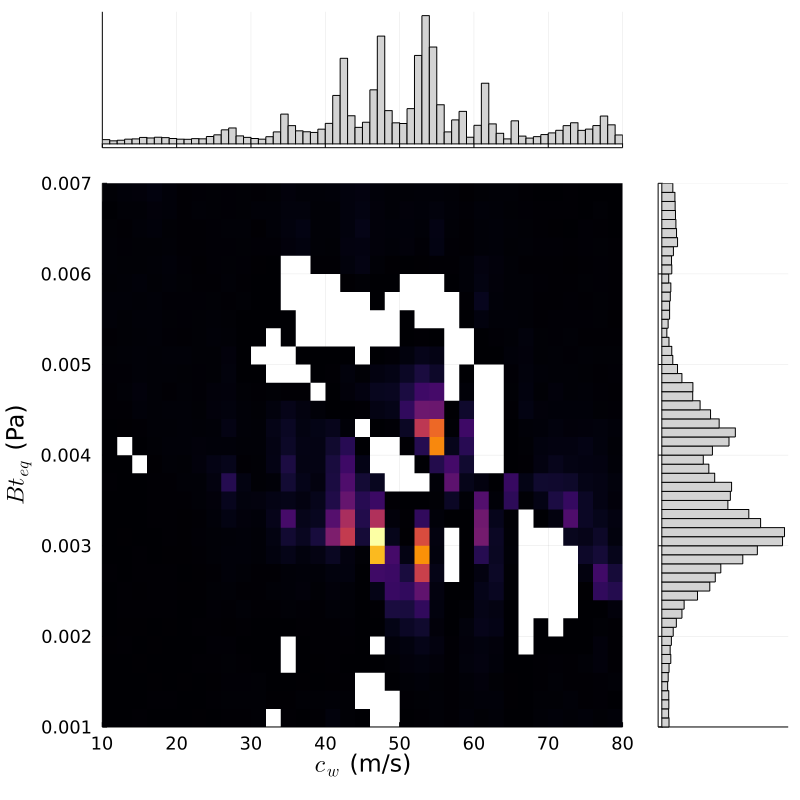

Begin MCMC - with step size 0.2
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[50.00291283237166; 0.003663392925418122;;]
posterior covariance
[214.6568686814549 0.0; 0.0 1.28331847121085e-6]


In [43]:
all_posterior_samples = Any[]
for (iter, emulator) in enumerate(all_emulators)
    println(iter)
    
    println(" **** SAMPLE **** ")
    # initial values
    # Get the input parameters 
    u_iter = u[1:iter,:,:]
    g_iter = g_ens[1:iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * iter))

    input_output_pairs = PairedDataContainer(u_tp, g_tp, data_are_columns=true)
    u0 = vec(mean(get_inputs(input_output_pairs), dims=2))
    #u0 = Vector([50, 1e-3])
    println("initial parameters: ", u0)

    # MCMC settingsa
    mcmc_alg = "rwm" # random walk Metropolis

    # First let's run a short chain to determine a good step size
    burnin = 0
    step = 0.1 # first guess
    max_iter = 2000 # number of steps before checking acc/rej rate for step size determination
    yt_sample = truth   # the data (here it is the truth in the perfect model setting)
    mcmc_test = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, step, u0, max_iter, 
                             mcmc_alg, burnin, svdflag=true)
    new_step = MarkovChainMonteCarlo.find_mcmc_step!(mcmc_test, emulator, max_iter=max_iter)

    # Now begin the actual MCMC
    println("Begin MCMC - with step size ", new_step)
    burnin = 1000
    max_iter = 100000
    mcmc = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, new_step, u0, max_iter, mcmc_alg,
                        burnin, svdflag=true)
    MarkovChainMonteCarlo.sample_posterior!(mcmc, emulator, max_iter)

    posterior = MarkovChainMonteCarlo.get_posterior(mcmc)

    post_mean = get_mean(posterior)
    post_cov = get_cov(posterior)

    println("prior mean")
    println(get_mean(mcmc.prior))
    println("prior covariance")
    println(get_cov(mcmc.prior))

    println("posterior mean")
    println(post_mean)
    println("posterior covariance")
    println(post_cov)
    
    posterior_samples_1 = dropdims(get_distribution(posterior)[param_names[1]],
                                         dims=1)
    posterior_samples_2 = dropdims(get_distribution(posterior)[param_names[2]],
                                                                            dims=1) 
    posterior_samples = hcat(posterior_samples_1, posterior_samples_2)

    push!(all_posterior_samples, posterior_samples)
    
    
    xs = collect(range(10.0, stop=70., length=1000))

    posterior_samples =(posterior_samples_1[1000:90000])
    mcmc_prior_dist = (prior_cw_tropics)
    tophist=histogram(posterior_samples, bins=100, normed=true, fill=:lightgray, xlim=(10, 80),
                  thickness_scaling=2.0, lab=:false, legend=:false,
        xtickfontsize=8, ytickfontsize=8, yaxis=nothing)
    #plot!(tophist,xs, pdf.(mcmc_prior_dist, xs), w=2.6, color=:blue, lab="Prior")
    #plot!(tophist,[u_truth[1]], seriestype="vline", w=2.6, lab="Truth")
    #title!(tophist, u_display_names[1])
    # remove ticks
    plot!(tophist, yformatter=_->"")
    plot!(tophist, xformatter=_->"")

    plot(tophist, size=(800, 300))

    xs = collect(range(10.0, stop=70., length=1000))

    posterior_samples =(posterior_samples_2[1000:90000])
    mcmc_prior_dist =  (prior_Bt_eq)
    righthist=histogram(posterior_samples, bins=100, normed=true, fill=:lightgray, ylim=(0.001, 0.007),
                  thickness_scaling=2.0,  legend=:false, orientation=:h, lab=:false,  
        xtickfontsize=8, ytickfontsize=8, xrotation=45, xaxis=nothing)
    #plot!(righthist, pdf.(mcmc_prior_dist, xs),  xs, w=2.6, color=:blue, lab=:false)
    #plot!(righthist, [u_truth[2]], seriestype="hline", w=2.6, lab=:false)
    # Remove ticks
    plot!(righthist, yformatter=_->"")
    plot!(righthist, xformatter=_->"")

    #title!(righthist, u_display_names[2], orientation=:v)
    plot(righthist, size=(300, 800))

    hist2d=histogram2d(posterior_samples_1[1000:90000], posterior_samples_2[1000:90000]; 
          label=:false, ylabel=u_display_names[2]*" "*u_units[2], xlabel=u_display_names[1]*" "*u_units[1],
        xlim=(10, 80), ylim=(0.001, 0.007),  xtickfontsize=12, ytickfontsize=12,
       # c = cgrad(:inferno, rev=true),
        xguidefontsize=16,  yguidefontsize=16, colorbar=:false) #, title="Gravity wave parameters")


    plot(hist2d, size=(600,600))
    
    layout = @layout [tophist{0.8w,0.2h} _
                  hist2d{0.8w,0.8h} righthist{0.2w,0.8h}]



    plot_all = plot( tophist, hist2d, righthist, 
        layout=layout, 
        size=(800, 800), 
        legend = :true,  legendfont=font(6, "Computer Modern"))# , #,  
        #plot_title="Posterior Distribution iteration $(iter)", titlefont=font(18, "Computer Modern"))
    ##savefig(plot_all,"../output/samples.png")
    savefig(plot_all, "$(plotdir)/2d_hist_posterior_samples_$(iter).png")

    display(plot_all)
end




In [44]:
## Save some samples at each iteration to csv for plotting in python


all_posterior_samples = Any[]
for (iter, emulator) in enumerate(all_emulators)
    println(iter)
    
    println(" **** SAMPLE **** ")
    # initial values
    # Get the input parameters 
    u_iter = u[1:iter,:,:]
    g_iter = g_ens[1:iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * iter))

    input_output_pairs = PairedDataContainer(u_tp, g_tp, data_are_columns=true)
    u0 = vec(mean(get_inputs(input_output_pairs), dims=2))
    #u0 = Vector([50, 1e-3])
    println("initial parameters: ", u0)

    # MCMC settingsa
    mcmc_alg = "rwm" # random walk Metropolis

    # First let's run a short chain to determine a good step size
    burnin = 0
    step = 0.1 # first guess
    max_iter = 2000 # number of steps before checking acc/rej rate for step size determination
    yt_sample = truth   # the data (here it is the truth in the perfect model setting)
    mcmc_test = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, step, u0, max_iter, 
                             mcmc_alg, burnin, svdflag=true)
    new_step = MarkovChainMonteCarlo.find_mcmc_step!(mcmc_test, emulator, max_iter=max_iter)

    # Now begin the actual MCMC
    println("Begin MCMC - with step size ", new_step)
    burnin = 1000
    max_iter = 100000
    mcmc = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, new_step, u0, max_iter, mcmc_alg,
                        burnin, svdflag=true)
    MarkovChainMonteCarlo.sample_posterior!(mcmc, emulator, max_iter)

    posterior = MarkovChainMonteCarlo.get_posterior(mcmc)

    post_mean = get_mean(posterior)
    post_cov = get_cov(posterior)

    println("prior mean")
    println(get_mean(mcmc.prior))
    println("prior covariance")
    println(get_cov(mcmc.prior))

    println("posterior mean")
    println(post_mean)
    println("posterior covariance")
    println(post_cov)
    
    posterior_samples_1 = dropdims(get_distribution(posterior)[param_names[1]],
                                         dims=1)
    posterior_samples_2 = dropdims(get_distribution(posterior)[param_names[2]],
                                                                            dims=1) 
    
    posterior_sample_table = Tables.table(hcat(posterior_samples_1, posterior_samples_2))
    posterior_sample_filename = ("$(basedir)/iteration_$(iter)/posterior_samples.csv")

    CSV.write(posterior_sample_filename,  posterior_sample_table, writeheader=false)

end
    

1
 **** SAMPLE **** 
initial parameters: [42.91135155040035, 0.0039889373276449395]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
Begin step size search
iteration 0; current parameters [42.91135155040035 0.0039889373276449395]
iteration 2000; acceptance rate = 0.7311344327836082, current parameters [51.54274048933114; 0.002430371743453382;;]
new step size: 0.2
iteration 2000; acceptance rate = 0.49825087456271866, current parameters [61.3365530742495; 0.002818901521312431;;]
new step size: 0.4
iteration 2000; acceptance rate = 0.2683658170914543, current parameters [62.972640614997715; 0.0017155740009583878;;]
Begin MCMC - with step size 0.4
[27.915249015787193, 22.897857142857138]


Begin MCMC - with step size 0.4
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
[27.915249015787193, 22.897857142857138]
[0.7628561021322771 0.2469009017948283; 0.2469009017948283 0.2844323696145124]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-37.187448429357566, 24.047146870695993]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[49.338786739741856; 0.0036632138642097903;;]
posterior covariance
[201.8838677789511 0.0; 0.0 1.231293572299469e-6]


In [45]:
posterior_sample_table = Tables.table(hcat(posterior_samples_1, posterior_samples_2))
posterior_sample_filename = ("$(basedir)/iteration_$(iter)/posterior_samples.csv")

CSV.write(posterior_sample_filename,  posterior_sample_table, writeheader=false)


LoadError: UndefVarError: iter not defined

In [46]:
posterior_sample_filename

LoadError: UndefVarError: posterior_sample_filename not defined